In [2]:
import numpy as np
import pandas as pd
import argparse
import glob
import matplotlib.pyplot as plt
import matplotlib 
from collections import defaultdict
from pathlib import Path
from scipy.ndimage import uniform_filter1d
from scipy import stats

matplotlib.rc('xtick', labelsize=16) 
matplotlib.rc('ytick', labelsize=16) 
plt.rcParams.update({'font.size': 16})

In [3]:
class Event:
    def __init__(self, raw_data, step_times, file_name, event_idx, abs_val_force=True, envelope=150, baseline_buffer=20, baseline_drift_threshold=1):
        self.raw_data = raw_data
        self.step_times = step_times
        self.number_of_steps = len(self.step_times) - 1
        self.file_name = file_name
        self.event_idx = event_idx
        self.abs_val_force = abs_val_force
        self.envelope = envelope
        self.baseline_buffer = baseline_buffer
        self.baseline_drift_threshold = baseline_drift_threshold  # set 1 pN drift threshold
        
        # Calculate timepoint indices
        self.timepoint_indices = np.searchsorted(self.raw_data[0], self.step_times)
        self.event_trace = self.raw_data[:, (self.timepoint_indices[0] - self.envelope): (self.timepoint_indices[-1] + self.envelope)]
        
        # Calculate baselines
        self._calculate_baselines()
        self.baseline_traces, self.calculated_baselines = self._calculate_baselines()
        self.event_baseline_avg = np.mean(self.calculated_baselines, axis=0)
        self.drift_flag = np.any(np.abs(self.calculated_baselines[1] - self.calculated_baselines[0]) > baseline_drift_threshold)
        
        # Analyze steps
        self.trap_step_traces = []
        self.step_forces = []  # stores averages of force values across a timestep (2, n array, where n is number of steps)
        self.step_lifetime = []
        for start, end in zip(self.timepoint_indices, self.timepoint_indices[1:]):
            step_trace = self.raw_data[:, start:end + 1]
            
            # Consider only trap 1 and trap 2 trace output means
            uncorrected_mean_force = np.mean(step_trace[1:3], axis=1)
            mean_force = np.around(uncorrected_mean_force - self.event_baseline_avg, 4)
            lifetime = step_trace[0][-1] - step_trace[0][0]  # calculate using only the time trace

            self.trap_step_traces.append(step_trace)
            self.step_forces.append(np.around(mean_force, 4))
            self.step_lifetime.append(np.around(lifetime, 4))
            
        if self.abs_val_force is True:
            self.step_forces = np.absolute(self.step_forces)
        
        self.sum_forces = np.around(np.sum(self.step_forces, axis=1), 4)  # add trap1+trap2 for each step
   
    def _calculate_baselines(self):
        traces = self.raw_data
        event_start_idx = self.timepoint_indices[0]
        event_end_idx = self.timepoint_indices[-1]
        
        before_event = self.raw_data[:, (event_start_idx - self.envelope):(event_start_idx - self.baseline_buffer)]
        after_event = self.raw_data[:, (event_end_idx + self.baseline_buffer):(event_end_idx + self.envelope)]
        
        # Consider only trap 1 and trap 2 trace output means
        mean_baseline_before_event = np.around(before_event[1:3].mean(axis=1), 4)
        mean_baseline_after_event = np.around(after_event[1:3].mean(axis=1), 4)

        calculated_baselines = [mean_baseline_before_event, mean_baseline_after_event]
        baseline_traces = [before_event, after_event]        
        return baseline_traces, calculated_baselines
    
    def plot_event(self):
        fig, ax = plt.subplots(3,1, figsize=(20,10))
        label_names = ['Trap 1 (pN)', 'Trap 2 (pN)', 'Stage (nm)']
        plt.xlabel('Time (s)')
        
        ax[0].set_title(f'{self.file_name}, event#: {self.event_idx}, [force (pN), lifetime(s)]: {list(zip(self.sum_forces, self.step_lifetime))}')

        for i in range(3):
            ax[i].grid(True)
            ax[i].set_ylabel(label_names[i])
            ax[i].plot(self.event_trace[0], self.event_trace[i + 1], linewidth = 0.3, color='k')

            if i == 0 or i == 1:  # i corresponds to trap 1 (idx0) or trap2 (idx1)
                textstr = '\n'.join((f'Baseline before event: {self.calculated_baselines[0][i]} pN', 
                                    f'Baseline after event: {self.calculated_baselines[1][i]} pN'))
                ax[i].text(0.91, 0.15, textstr, horizontalalignment='center', verticalalignment='center', 
                           transform=ax[i].transAxes, bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.2))
                
            # highlight over the trace used in baseline calculation
            for baseline_trace in self.baseline_traces:
                ax[i].plot(baseline_trace[0], baseline_trace[i + 1], color='k')

            # highlight over the trace used for calculating mean force in respective traps
            for step_trace in reversed(self.trap_step_traces):
                ax[i].plot(step_trace[0], step_trace[i+1])

    def to_dict(self):
        return {
            'File Name': self.file_name,
            'Mean Total Step Force': self.sum_forces,
            'Step Lifetime': self.step_lifetime,
            'Number of Steps': self.number_of_steps,
            'Baseline Drift?': self.drift_flag,
        }
    
class DataFile:
    def __init__(self, file_name):
        data = np.load(file_name, allow_pickle=True)
        self.file_name = Path(file_name).with_suffix('').name
        self.events = [Event(data['raw_data'], step_times, self.file_name, event_idx) 
                       for event_idx, step_times in enumerate(data['merged'])]

    def show_dataframe(self):
        return pd.DataFrame.from_records([e.to_dict() for e in self.events])

def plot_traces_from_file(filename):
    analyzed_file_data = DataFile(filename)
    print(f'Number of events: {len(analyzed_file_data.events)}')
    multistep = []
    singlestep = []
    for event in analyzed_file_data.events:
        if event.number_of_steps > 1:
            multistep.append(event)
        else: 
            singlestep.append(event)
        event.plot_event()
    print(f'Multistep: {len(multistep)}, Single step: {len(singlestep)}')

class Last_Step_F_LT_Analysis:
    def __init__(self, path):
        self.path = path
        self.all_events = self._extract_all_data(path)
        
        self.multistep_last_step_F_lt = [] # stores all (force, lifetime) corrsp to multistep events in list
        self.singlestep_last_step_F_lt = []  # stores all (force, lifetime) corrsp to singlestep events in list
        self.all_last_step_F_lt = []
        
        self.all_multistep_events = []  # stores all multistep event information in list; maintains ordering
        self.all_singlestep_events = []  # stores all singlestep event information in list; maintains ordering

        for event in self.all_events:
            if event.number_of_steps > 1:
                self.multistep_last_step_F_lt.append((event.sum_forces[-1], event.step_lifetime[-1]))
                self.all_multistep_events.append(event)
            else:
                self.singlestep_last_step_F_lt.append((event.sum_forces[-1], event.step_lifetime[-1]))
                self.all_singlestep_events.append(event)
            
            self.all_last_step_F_lt.append((event.sum_forces[-1], event.step_lifetime[-1]))
        
    def _extract_all_data(self, path):
        all_events = []
        for file in glob.glob(path):
#             print(file)
            analyzed_file_data = DataFile(file)
            all_events += analyzed_file_data.events  # add events to all_events
        return all_events
    
    # returns alleventlist, ls_forces, ls_lifetimes
    def _return_event_F_and_lt_list_of_type(self, multistep_or_single_step):
        if multistep_or_single_step not in ['multistep', 'singlestep', 'all']:
            raise ValueError("multistep_or_single_step should be either 'multistep', 'singlestep', or 'all'")
        if multistep_or_single_step == 'multistep':
            return self.all_multistep_events, *zip(*self.multistep_last_step_F_lt)
        elif multistep_or_single_step == 'singlestep':
            return self.all_singlestep_events, *zip(*self.singlestep_last_step_F_lt)
        else:  # return all events
            return self.all_events, *zip(*self.all_last_step_F_lt)

    def scatter_plot_last_step_data(self, multistep_or_single_step):
        plt.figure(figsize=(7, 5))
        plt.xlim([0, 14.5])
        plt.ylim([0, 25])
        _, ls_forces, ls_lifetimes = self._return_event_F_and_lt_list_of_type(multistep_or_single_step)
        plotlabel = str(len(ls_forces)) + ' events' +  ' (' + multistep_or_single_step + ')'
        plt.scatter(ls_forces, ls_lifetimes, alpha=0.3, label=plotlabel)  # unpack tuples in zip
        plt.xlabel('Force (pN)')
        plt.ylabel('Lifetime (s)')
#         plt.legend()
        plt.show()

class binnedLastStepData:
    def __init__(self, all_F_LT_analyzed_events, multistep_or_single_step, nbins):
        #  all_F_LT_analyzed_events is a class instance, multistep_or_single_step is a string, nbins is int representing # of bins
        self.all_F_LT_analyzed_events = all_F_LT_analyzed_events
        self.multistep_or_single_step = multistep_or_single_step
        self.nbins = nbins

        # call method from all_F_LT_analyzed_events class instance
        self.event_list, self.ls_forces, self.ls_lifetimes = self.all_F_LT_analyzed_events._return_event_F_and_lt_list_of_type(self.multistep_or_single_step)
        self.numevents = len(self.ls_forces)  # number of events of type self.multistep_or_single_step
        
        last_step_data = [self.ls_forces, self.ls_lifetimes]
        binned_data, self.bin_edges, self.binnumber = stats.binned_statistic(self.ls_forces, last_step_data, 'mean', bins=nbins)
        self.num_pts_in_bins, _ = np.histogram(self.ls_forces, bins=self.nbins)
        self.binned_forces, self.binned_lifetimes = binned_data[0], binned_data[1]
    
    def show_dataframe(self):
        show_data = {
            'Binned Forces': self.binned_forces,
            'Binned Lifetimes': self.binned_lifetimes,
            'Number of Datapoints': self.num_pts_in_bins,
                    }

        pd.options.display.float_format = "{:,.4f}".format  # display only 4 decmial points
        display(pd.DataFrame.from_dict(show_data))
    
    def plot_histogram(self, show_dataframe=True):
        if show_dataframe:
            self.show_dataframe()
        fig, ax = plt.subplots(figsize=(9, 6))
        ax.set_xlabel('Force (pN)')
        ax.set_ylabel('Lifetime (s)')
#         ax.set_title(f'Force vs Lifetime Histogram - Equal-Width Bins: {self.nbins} bins, {self.numevents} {self.multistep_or_single_step} events')
        plt.xlim([0, 14])
        plt.ylim([0, 10])
        ax.scatter(self.binned_forces, self.binned_lifetimes, s=4*self.num_pts_in_bins, color='#DA3B26', alpha=0.5, edgecolor='k')
#         plt.show()

    
    def parse_events_from_bin(self, bin_idx):
    # note that bin_idx is zero-indexed and not a class variable
        print(f'Binned F: {"{:.4f}".format(self.binned_forces[bin_idx])} pN, Binned LT: {"{:.4f}".format(self.binned_lifetimes[bin_idx])} s, # Events: {self.num_pts_in_bins[bin_idx]}')
        events_in_bin = np.array(self.event_list)[tuple([self.binnumber==bin_idx + 1])]
        ls_forces_in_bin = np.array(self.ls_forces)[tuple([self.binnumber==bin_idx + 1])]
        ls_lifetimes_in_bin = np.array(self.ls_lifetimes)[tuple([self.binnumber==bin_idx + 1])]
        
        return events_in_bin, ls_forces_in_bin, ls_lifetimes_in_bin
    
    def survival_plot_in_bin(self, bin_idx):
        _, ls_forces_in_bin, ls_lifetimes_in_bin = self.parse_events_from_bin(bin_idx)
        plt.figure(figsize=(5, 4))
        plt.scatter(np.sort(ls_lifetimes_in_bin)[::-1], np.arange(1,len(ls_lifetimes_in_bin)+1)/float(len(ls_lifetimes_in_bin)), label=f'{len(ls_lifetimes_in_bin)} events', c='None', edgecolors='#004c6d')
        plt.legend()
        plt.yscale('log')
        plt.xlabel('Lifetime (s)')
        plt.ylabel('Survival Probability')
        plt.title(f'Survival Plot in Binned F: {"{:.4f}".format(self.binned_forces[bin_idx])} pN, Binned LT: {"{:.4f}".format(self.binned_lifetimes[bin_idx])} s')
    

In [4]:
# In this cell, initialize data analysis
file = '/Users/amywang/Desktop/analysis/trap-analysis/abd/*.npz'
# file = '/Users/amywang/Desktop/analysis/trap-analysis/ternarydH1_new_cal/211029_25uM_Ecyto_cell6_db4b6b_0-100s.npz'
analyze_events = Last_Step_F_LT_Analysis(file)

In [5]:
event_list, ls_forces, ls_lifetimes = analyze_events._return_event_F_and_lt_list_of_type('singlestep')

In [6]:
len(ls_forces)

561

In [7]:
import xlrd

def extract_last_step_force_lifetimes_from_xls(filename, multi_or_single_step):
    file = xlrd.open_workbook(filename).sheet_by_index(0)

    multistep_events = []
    singlestep_events = []

    for row in range(6, file.nrows):
        number_of_entries = 0
        for col in range(file.ncols):
            if file.cell_type(row, col) is not xlrd.XL_CELL_EMPTY:
                number_of_entries += 1

        if number_of_entries > 2:
            multistep_events.append(file.row_values(row))
        if number_of_entries == 2:
            singlestep_events.append(file.row_values(row))
    
    # generate a list of (force, lifetime) tuples 
    
    if multi_or_single_step == 'multistep':
        last_step_f_lifetime = [(event_row[0], event_row[1]) for event_row in multistep_events]
    elif multi_or_single_step == 'singlestep':
        last_step_f_lifetime = [(event_row[0], event_row[1]) for event_row in singlestep_events]
    elif multistep_or_singlestep == 'all':
        last_step_f_lifetime = [(event_row[0], event_row[1]) for event_row in multistep_events + singlestep_events]
    else:
        raise ValueError("multistep_or_single_step should be either 'multistep', 'singlestep', or 'all'")
    
    last_step_forces, last_step_lifetimes = zip(*last_step_f_lifetime)
    return np.array(last_step_forces), np.array(last_step_lifetimes)

last_step_WT_tern_forces, last_step_WT_tern_lifetimes = extract_last_step_force_lifetimes_from_xls('ternary_forcevslifetime.xls', 'multistep')

In [ ]:
import numpy as np
import pandas as pd


# convert to pandas DataFrames
timeABD = pd.DataFrame(ls_lifetimes)
forcesABD = pd.DataFrame(ls_forces)
# timeWT = pd.DataFrame(last_step_WT_tern_lifetimes)
# forcesWT = pd.DataFrame(last_step_WT_tern_forces)


# Use pandas Excel Writer to create one Excel file with
# a sheet for each array
with pd.ExcelWriter('yourexcelfile.xlsx') as writer:
    timeABD.to_excel(writer, sheet_name='timeABD')
    forcesABD.to_excel(writer, sheet_name='forcesABD')
#     timeWT.to_excel(writer, sheet_name='timeWT')
#     forcesWT.to_excel(writer, sheet_name='forcesWT')

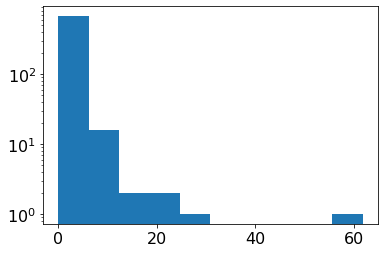

In [19]:
plt.hist(last_step_WT_tern_lifetimes)
plt.yscale('log')

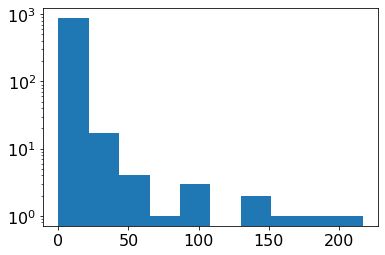

In [20]:
plt.hist(ls_ABD_lifetimes)
plt.yscale('log')

In [32]:
from scipy.stats import ks_2samp

ks_2samp(last_step_WT_tern_lifetimes, ls_ABD_lifetimes[np.array(ls_forces) < 12])

KstestResult(statistic=0.13838995587361394, pvalue=1.0748433676210922e-05)

(array([44.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.]),
 array([4.00000e-03, 1.23380e+00, 2.46360e+00, 3.69340e+00, 4.92320e+00,
        6.15300e+00, 7.38280e+00, 8.61260e+00, 9.84240e+00, 1.10722e+01,
        1.23020e+01]),
 <BarContainer object of 10 artists>)

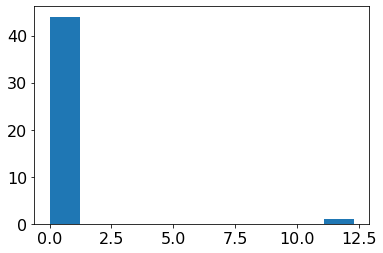

In [15]:
plt.hist(ls_ABD_lifetimes[np.array(ls_forces) < 2])

In [7]:
np.mean(last_step_WT_tern_lifetimes[np.abs(last_step_WT_tern_forces) < 2.5])

0.28245454545454546

In [34]:
len(ls_ABD_lifetimes[np.array(ls_forces) < 12])

569

In [27]:
ks_2samp(np.abs(last_step_WT_tern_forces[last_step_WT_tern_forces < 0]), ls_forces)

KstestResult(statistic=0.5629059829059829, pvalue=5.551115123125783e-16)

In [9]:
ls_forces = np.array(ls_forces)
ls_lifetimes = np.array(ls_lifetimes)
len(ls_forces[ls_forces<2.5])

63

In [10]:
np.mean(ls_lifetimes[ls_forces<2.5])

0.3873650793650794

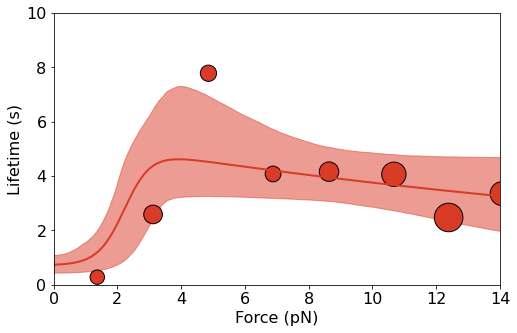

In [9]:
fig, ax = plt.subplots(figsize=(8, 5))
matplotlib.rc('xtick', labelsize=16) 
matplotlib.rc('ytick', labelsize=16) 
plt.rcParams.update({'font.size': 16})

def two_state_catch_lifetime(params, F):
    k10, x10, k20, x20, k21, x21, k12, x12 = params
    k10_F = k_F(k10, x10, F)
    k20_F = k_F(k20, x20, F)
    k12_F = k_F(k12, x12, F)
    k21_F = k_F(k21, x21, F)
    
#     print(f'k10: {k10_F}, k20: {k20_F}, k12: {k12_F}, k21: {k21_F}')
    
    B1 = k21 * k10 / ((k21 * k10 + k12 * k20))   # flux balance assuming states 1 and 2 have time to reach equilibrium
#     B1 = k21 / (k21 + k12)   # flux balance assuming states 1 and 2 have time to reach equilibrium
    B2 = 1 - B1
    b = k21_F + k20_F + k12_F + k10_F
    c = (k21_F * k10_F) + (k10_F * k20_F) + (k12_F * k20_F)
    
    lambda1 = (b + np.sqrt(b**2 - 4*c)) / 2
    lambda2 = (b - np.sqrt(b**2 - 4*c)) / 2

    C1 = (k21_F + k12_F + (B1 * k20_F) + (B2 * k10_F) - lambda1) / (lambda2 - lambda1)
    C2 = 1 - C1
    
    return C1 / lambda1 + C2 / lambda2

def k_F(k, x, F):
    kbT = 4.1124
    return k * np.exp(F * x / kbT)

def lifetime_CIs(fitted_lifetime_force_array):
    CIs_95 = []
    for f_idx in range(fitted_lifetime_force_array.shape[1]):
        lifetimes_for_all_fits = fitted_lifetime_force_array[:, f_idx]
        CIs_95.append([np.percentile(lifetimes_for_all_fits, 2.5), np.percentile(lifetimes_for_all_fits, 97.5)])
    return np.squeeze(np.array(CIs_95))

bootstrapped = np.load('/Users/amywang/Desktop/analysis/trap-analysis/matlab_catch_bond_fitting/bootstrapped_lifetimes_across_force_range_ABD.npz')
best_fit_params = bootstrapped['best_fit_params']
force_array = bootstrapped['force_array']
bootstrapped_lifetimes = bootstrapped['bootstrapped_lifetimes']

bounds = lifetime_CIs(bootstrapped_lifetimes)
f_array = np.linspace(0, 20, 2001)
plt.fill_between(f_array, bounds[:, 0], bounds[:, 1], alpha=0.5, color='#DA3B26')

# best fits for multistep ABD data
k10 = 1.3962
k20 = 0.0511
k12 = 0.4629
k21 = 15.0188
x10 = 0.002
x20 = 0.1727
x12 = 0.0041
x21 = -9.6944
two_state_catch_fit_params = [k10, x10, k20, x20, k21, x21, k12, x12]
plt.plot(f_array, [two_state_catch_lifetime(two_state_catch_fit_params, f) for f in f_array], color='#DA3B26', linewidth=2)
# plt.title('ABD multi-step (i.e. last-step)')
plt.xlim([0, 14])
plt.ylim([0, 10])
plt.xlabel('Force (pN)')
plt.ylabel('Lifetime (s)')


multistep = binnedLastStepData(analyze_events, 'multistep', nbins=10)
plt.scatter(multistep.binned_forces, multistep.binned_lifetimes, s=4*multistep.num_pts_in_bins, color='#DA3B26', edgecolor='k')

plt.savefig('/Users/amywang/Desktop/ABD.pdf')

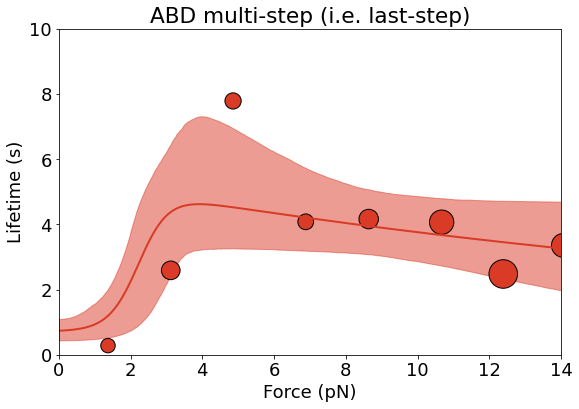

In [12]:
fig, ax = plt.subplots(figsize=(9, 6))
matplotlib.rc('xtick', labelsize=18) 
matplotlib.rc('ytick', labelsize=18) 
plt.rcParams.update({'font.size': 18})

def two_state_catch_lifetime(params, F):
    k10, x10, k20, x20, k21, x21, k12, x12 = params
    k10_F = k_F(k10, x10, F)
    k20_F = k_F(k20, x20, F)
    k12_F = k_F(k12, x12, F)
    k21_F = k_F(k21, x21, F)
    
#     print(f'k10: {k10_F}, k20: {k20_F}, k12: {k12_F}, k21: {k21_F}')
    
    B1 = k21 * k10 / ((k21 * k10 + k12 * k20))   # flux balance assuming states 1 and 2 have time to reach equilibrium
#     B1 = k21 / (k21 + k12)   # flux balance assuming states 1 and 2 have time to reach equilibrium
    B2 = 1 - B1
    b = k21_F + k20_F + k12_F + k10_F
    c = (k21_F * k10_F) + (k10_F * k20_F) + (k12_F * k20_F)
    
    lambda1 = (b + np.sqrt(b**2 - 4*c)) / 2
    lambda2 = (b - np.sqrt(b**2 - 4*c)) / 2

    C1 = (k21_F + k12_F + (B1 * k20_F) + (B2 * k10_F) - lambda1) / (lambda2 - lambda1)
    C2 = 1 - C1
    
    return C1 / lambda1 + C2 / lambda2

def k_F(k, x, F):
    kbT = 4.1124
    return k * np.exp(F * x / kbT)

def lifetime_CIs(fitted_lifetime_force_array):
    CIs_95 = []
    for f_idx in range(fitted_lifetime_force_array.shape[1]):
        lifetimes_for_all_fits = fitted_lifetime_force_array[:, f_idx]
        CIs_95.append([np.percentile(lifetimes_for_all_fits, 2.5), np.percentile(lifetimes_for_all_fits, 97.5)])
    return np.squeeze(np.array(CIs_95))

bootstrapped = np.load('/Users/amywang/Desktop/analysis/trap-analysis/matlab_catch_bond_fitting/bootstrapped_lifetimes_across_force_range_ABD.npz')
best_fit_params = bootstrapped['best_fit_params']
force_array = bootstrapped['force_array']
bootstrapped_lifetimes = bootstrapped['bootstrapped_lifetimes']

bounds = lifetime_CIs(bootstrapped_lifetimes)
f_array = np.linspace(0, 20, 2001)
plt.fill_between(f_array, bounds[:, 0], bounds[:, 1], alpha=0.5, color='#DA3B26')

# best fits for multistep ABD data
k10 = 1.3962
k20 = 0.0511
k12 = 0.4629
k21 = 15.0188
x10 = 0.002
x20 = 0.1727
x12 = 0.0041
x21 = -9.6944
two_state_catch_fit_params = [k10, x10, k20, x20, k21, x21, k12, x12]
plt.plot(f_array, [two_state_catch_lifetime(two_state_catch_fit_params, f) for f in f_array], color='#DA3B26', linewidth=2)
plt.title('ABD multi-step (i.e. last-step)')
plt.xlim([0, 14])
plt.ylim([0, 10])
plt.xlabel('Force (pN)')
plt.ylabel('Lifetime (s)')


multistep = binnedLastStepData(analyze_events, 'multistep', nbins=10)
plt.scatter(multistep.binned_forces, multistep.binned_lifetimes, s=4*multistep.num_pts_in_bins, color='#DA3B26', edgecolor='k')

plt.savefig('/Users/amywang/Documents/catch_bond_mechanism_paper/matplotlib_figs/ABD_s7b.pdf')

Text(0, 0.5, 'Lifetime (s)')

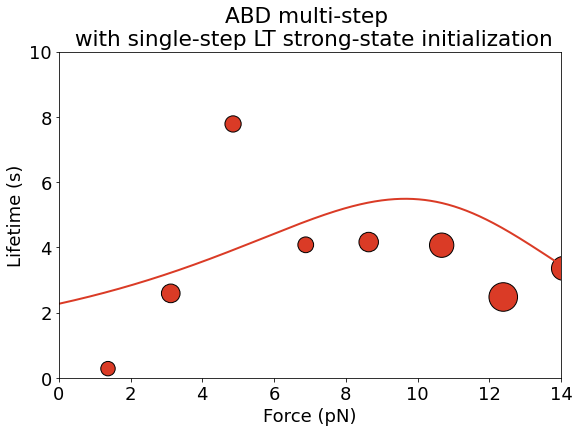

In [23]:
# check to see if it is a strong state stabilization initial condition:
def two_state_catch_lifetime_strong_state_IC(params, F):
    k10, x10, k20, x20, k21, x21, k12, x12 = params
    k10_F = k_F(k10, x10, F)
    k20_F = k_F(k20, x20, F)
    k12_F = k_F(k12, x12, F)
    k21_F = k_F(k21, x21, F)
    
#     print(f'k10: {k10_F}, k20: {k20_F}, k12: {k12_F}, k21: {k21_F}')

    B1 = 0
    B2 = 1
    b = k21_F + k20_F + k12_F + k10_F
    c = (k21_F * k10_F) + (k10_F * k20_F) + (k12_F * k20_F)
    
    lambda1 = (b + np.sqrt(b**2 - 4*c)) / 2
    lambda2 = (b - np.sqrt(b**2 - 4*c)) / 2

    C1 = (k21_F + k12_F + (B1 * k20_F) + (B2 * k10_F) - lambda1) / (lambda2 - lambda1)
    C2 = 1 - C1
    
    return C1 / lambda1 + C2 / lambda2

# plot things:

# strong state IC
# k10 = 13.26
# k20 = 0.1264
# k12 = 24.38
# k21 = 607.48
# x10 = 4.48463
# x20 = 0.2497
# x12 = 7.4
# x21 = -6.9


k10 = 2.3121
k20 = 0.0028
k12 = 1.7081
k21 = 0.9407
x10 = 0.1936
x20 = 1.2879
x12 = 0.0857
x21 = -0.6461
fig, ax = plt.subplots(figsize=(9, 6))

two_state_catch_fit_params = [k10, x10, k20, x20, k21, x21, k12, x12]
plt.plot(f_array, [two_state_catch_lifetime_strong_state_IC(two_state_catch_fit_params, f) for f in f_array], color='#DA3B26', linewidth=2)

multistep = binnedLastStepData(analyze_events, 'multistep', nbins=10)
plt.scatter(multistep.binned_forces, multistep.binned_lifetimes, s=4*multistep.num_pts_in_bins, color='#DA3B26', edgecolor='k')
plt.title('ABD multi-step \n with single-step LT strong-state initialization')
plt.xlim([0, 14])
plt.ylim([0, 10])
plt.xlabel('Force (pN)')
plt.ylabel('Lifetime (s)')

(0.9997726673292693, 4.738019965242759)
(0.0028000000000000004, 0.1639652896481481)
(0.5062987088868454, 4.068627387106083)
(0.40002575446962074, 999.9999982090526)
(0.0020315489473580264, 0.4369528104066849)
(0.128859114800561, 1.4515663409834416)
(0.004, 0.42111421760749024)
(-10.366093924927004, -0.2920479786458448)


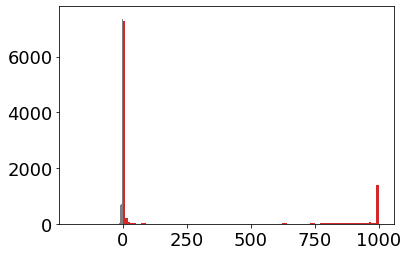

In [61]:
# k10, k20, k12, k21, x10, x20, x12, x21 = params[:-1]  # take params, not loss

def CIs(param_1D):
    plt.hist(param_1D, bins=100)
    return np.percentile(param_1D, 2.5), np.percentile(param_1D, 97.5)

for i in range(8):
    print(CIs(best_fit_params[:, i]))

,Binned Forces,Binned Lifetimes,Number of Datapoints
0,1.5015,0.0914,5
1,3.1711,0.3326,19
2,5.1845,1.7520,22
3,7.0152,1.8017,21
4,8.6285,2.0920,46
5,10.5839,2.2546,81
6,12.1899,2.0049,135
7,13.8995,1.8875,130
8,15.6159,0.9305,53
9,17.5537,0.0803,26


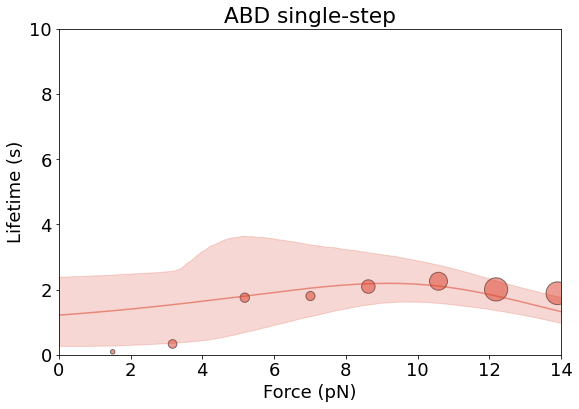

In [13]:
binnedLastStepData(analyze_events, 'singlestep', nbins=11).plot_histogram(show_dataframe=True)
bootstrapped = np.load('/Users/amywang/Desktop/analysis/trap-analysis/matlab_catch_bond_fitting/bootstrapped_lifetimes_across_force_range_ABD_single_step.npz')
best_fit_params = bootstrapped['best_fit_params']
force_array = bootstrapped['force_array']
bootstrapped_lifetimes = bootstrapped['bootstrapped_lifetimes']

bounds = lifetime_CIs(bootstrapped_lifetimes)
f_array = np.linspace(0, 20, 2001)
plt.fill_between(f_array, bounds[:, 0], bounds[:, 1], alpha=0.2, color='#DA3B26')

# ABD single step
k10 = 2.3121
k20 = 0.0028
k12 = 1.7081
k21 = 0.9407
x10 = 0.1936
x20 = 1.2879
x12 = 0.0857
x21 = -0.6461

# alternative values, ABD single step

# k10 = 2.3295
# k20 = 0.1111
# k12 = 2.2114
# k21 = 1000
# x10 = 0.1909
# x20 = 0.2618
# x12 = 0.0004
# x21 = -9.7629

two_state_catch_fit_params_single_step = [k10, x10, k20, x20, k21, x21, k12, x12]
f_array = np.linspace(0, 20, 2001)
plt.plot(f_array, [two_state_catch_lifetime(two_state_catch_fit_params_single_step, f) for f in f_array], color='#DA3B26', alpha=0.5)
plt.title('ABD single-step')

# Ternary last step multistep
# k10 = 13.2796
# k20 = 0.1861
# k12 = 1.1650
# k21 = 884.5267
# x10 = 0.002
# x20 = 0.7636
# x12 = 2.1749
# x21 = -15.1919
plt.savefig('/Users/amywang/Documents/catch_bond_mechanism_paper/matplotlib_figs/ABD_s7c.pdf')

# two_state_catch_fit_params = [k10, x10, k20, x20, k21, x21, k12, x12]
# plt.plot(f_array, [two_state_catch_lifetime(two_state_catch_fit_params, f) for f in f_array], color='#920E00', linewidth='2')

Text(0, 0.5, 'LR, $\\frac{IC_{strong}}{IC_{flux}}$')

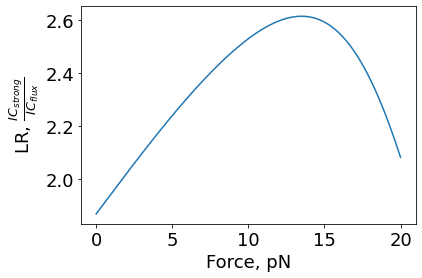

In [30]:
lr_ratio = [two_state_catch_lifetime_strong_state_IC(two_state_catch_fit_params_single_step, f) / two_state_catch_lifetime(two_state_catch_fit_params_single_step, f) for f in f_array]
plt.plot(f_array, lr_ratio)
plt.xlabel('Force, pN')
plt.ylabel(r'LR, $\frac{IC_{strong}}{IC_{flux}}$')

(0.0, 10.0)

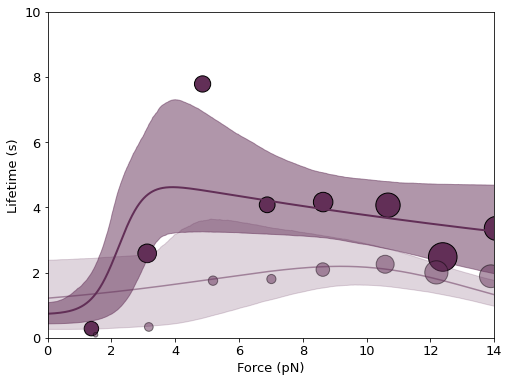

In [20]:
fig, ax = plt.subplots(figsize=(8, 6))
ax.set_xlabel('Force (pN)')
ax.set_ylabel('Lifetime (s)')

bootstrapped = np.load('/Users/amywang/Desktop/analysis/trap-analysis/matlab_catch_bond_fitting/bootstrapped_lifetimes_across_force_range_ABD.npz')
best_fit_params = bootstrapped['best_fit_params']
force_array = bootstrapped['force_array']
bootstrapped_lifetimes = bootstrapped['bootstrapped_lifetimes']

bounds = lifetime_CIs(bootstrapped_lifetimes)
f_array = np.linspace(0, 20, 2001)
plt.fill_between(f_array, bounds[:, 0], bounds[:, 1], alpha=0.5, color='#622f57')

# best fits for multistep ABD data
k10 = 1.3962
k20 = 0.0511
k12 = 0.4629
k21 = 15.0188
x10 = 0.002
x20 = 0.1727
x12 = 0.0041
x21 = -9.6944

two_state_catch_fit_params = [k10, x10, k20, x20, k21, x21, k12, x12]
plt.plot(f_array, [two_state_catch_lifetime(two_state_catch_fit_params, f) for f in f_array], color='#622f57', linewidth=2)
multistep = binnedLastStepData(analyze_events, 'multistep', nbins=10)

plt.scatter(multistep.binned_forces, multistep.binned_lifetimes, s=4*multistep.num_pts_in_bins, color='#622f57', edgecolor='k')

singlestep = binnedLastStepData(analyze_events, 'singlestep', nbins=11)

ax.scatter(singlestep.binned_forces, singlestep.binned_lifetimes, s=4*singlestep.num_pts_in_bins, color='#622f57', edgecolor='k', alpha=0.5)

bootstrapped = np.load('/Users/amywang/Desktop/analysis/trap-analysis/matlab_catch_bond_fitting/bootstrapped_lifetimes_across_force_range_ABD_single_step.npz')
best_fit_params = bootstrapped['best_fit_params']
force_array = bootstrapped['force_array']
bootstrapped_lifetimes = bootstrapped['bootstrapped_lifetimes']

bounds = lifetime_CIs(bootstrapped_lifetimes)
f_array = np.linspace(0, 20, 2001)
plt.fill_between(f_array, bounds[:, 0], bounds[:, 1], alpha=0.2, color='#622f57')

k10 = 2.3121
k20 = 0.0028
k12 = 1.7081
k21 = 0.9407
x10 = 0.1936
x20 = 1.2879
x12 = 0.0857
x21 = -0.6461

two_state_catch_fit_params = [k10, x10, k20, x20, k21, x21, k12, x12]
f_array = np.linspace(0, 20, 2001)
plt.plot(f_array, [two_state_catch_lifetime(two_state_catch_fit_params, f) for f in f_array], color='#622f57', alpha=0.5)


plt.xlim([0, 14])
plt.ylim([0, 10])


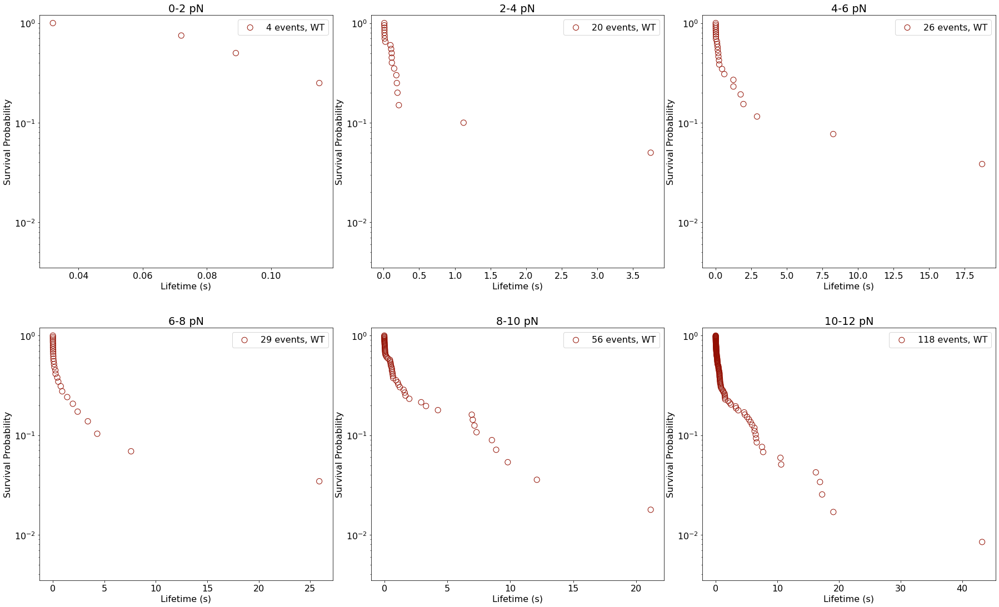

In [15]:
def return_array_indices_in_range(array, start, end):  # returns values in range [start, end) in the same relative ordering
    return (array >= start) & (array < end)  # the & operation returns elementwise-and of 2 bool arrays; different from using 'and'

def plot_fitted_inverse_CDF_exponential(xdata, ydata, color):  # xdata is lifetime sorted, ydata is survival probs
    popt_single, NLL_single, BIC_single = fit_to_model(single_exponential, single_exponential_likelihood, xdata, ydata)
    singlexp_label = 'Singlexp BIC: ' + str(np.around(BIC_single, 2))
    plt.plot(xdata, single_exponential(xdata, *popt_single), color, label=singlexp_label)
    
    popt_bi, NLL_single, BIC_bi = fit_to_model(biexponential, bi_exponential_likelihood, xdata, ydata)
    biexp_label = 'Biexp BIC: ' + str(np.around(BIC_bi, 3))
    plt.plot(xdata, biexponential(xdata, *popt_bi), color, linestyle='dotted', label=biexp_label)

def compute_inverse_CDF(force_range, dataset):
    # force_range is a 2-element list demarking the bounds of the force bin
    # dataset is a tuple of numpy arrays, (lifetimes, forces)
    lifetimes, forces = dataset
    indices_with_forces_in_range = return_array_indices_in_range(forces, force_range[0], force_range[1])
    ls_lifetimes_in_force_range = lifetimes[indices_with_forces_in_range]  
    sorted_lifetimes = np.sort(ls_lifetimes_in_force_range)[::-1]
    survival_prob = np.arange(1,len(ls_lifetimes_in_force_range)+1) / float(len(ls_lifetimes_in_force_range))
    return sorted_lifetimes, survival_prob
    
def plot_inverse_CDF_helper(force_range, dataset, label, color, fit_exponential):
    sorted_lifetimes, survival_prob = compute_inverse_CDF(force_range, dataset)
    plt.scatter(sorted_lifetimes, survival_prob, label= str(len(sorted_lifetimes)) + ' events, ' + str(label), c='None', edgecolors=color, s=100)
    
    if fit_exponential:
        plot_fitted_inverse_CDF_exponential(sorted_lifetimes, survival_prob, color)
        
    return survival_prob
    
def plot_inverse_CDF(force_range, dataset1, dataset2, fit_exponential):
    survival_prob1 = plot_inverse_CDF_helper(force_range, dataset1, 'WT', '#920E00',  fit_exponential)
    if dataset2:
        survival_prob2 = plot_inverse_CDF_helper(force_range, dataset2, '$\Delta$H1', '#416799', fit_exponential)         
    
    min_bound = 3.5e-3
    
    plt.ylim([min_bound, 1.2])
    plt.legend()
    plt.yscale('log')
    plt.xlabel('Lifetime (s)')
    plt.ylabel('Survival Probability')
    plt.title(f'{force_range[0]}-{force_range[1]} pN')

def plot_inverse_CDF_wrapper(list_of_force_bin_edges, dataset1, dataset2=None, fit_exponential=False):    
    fig, axarr = plt.subplots(2, len(list_of_force_bin_edges) // 2, figsize=(25, 15))
    plt.tight_layout(w_pad=1.5, h_pad=5)
    axarr = axarr.flatten()  # make into 1D array
    
    for plotidx, i in enumerate(list_of_force_bin_edges):
        plt.sca(axarr[plotidx])
        plot_inverse_CDF([i, i+2], dataset1, dataset2, fit_exponential)

plt.show()


plot_inverse_CDF_wrapper([0, 2, 4, 6, 8, 10], [np.array(ls_lifetimes), np.array(ls_forces)])

In [16]:
# binnedLastStepData(analyze_events, 'singlestep', nbins=8).plot_histogram(show_dataframe=True)

Binned F: 6.1170 pN, Binned LT: 1.9442 s, # Events: 21


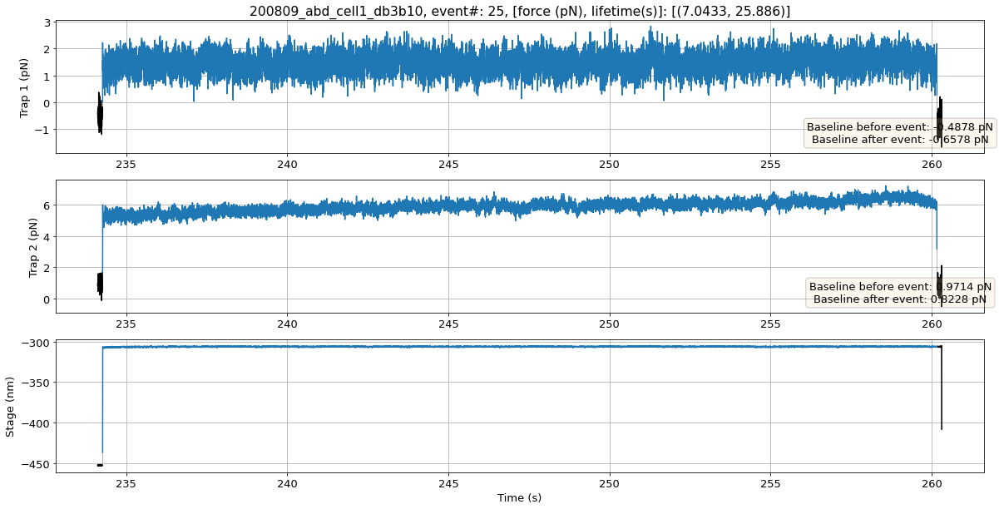

In [66]:
events_in_binidx, forces_in_bin_idx, lifetimes_in_bin_idx = binnedLastStepData(analyze_events, 'singlestep', nbins=12).parse_events_from_bin(3)

for event in events_in_binidx:
     if event.step_lifetime[-1] > 5:
            event.plot_event()

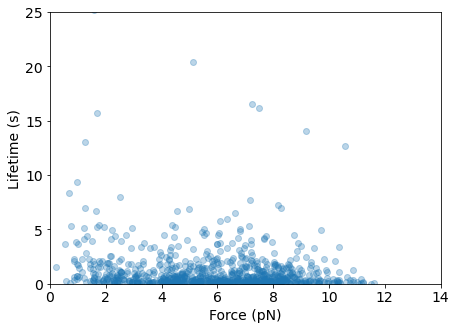

In [29]:
matplotlib.rc('xtick', labelsize=14) 
matplotlib.rc('ytick', labelsize=14) 
plt.rcParams.update({'font.size': 14})
analyze_events.scatter_plot_last_step_data('multistep')

len

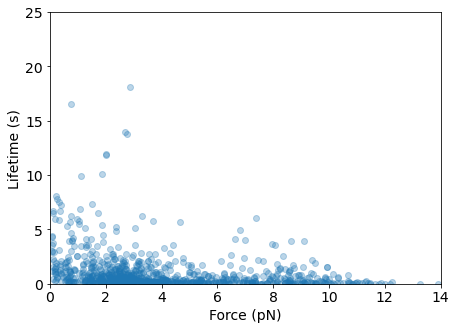

In [30]:
analyze_events.scatter_plot_last_step_data('singlestep')

Number of events: 62


<ipython-input-19-7daeec4810f1>:61: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(3,1, figsize=(20,10))


Multistep: 34, Single step: 28


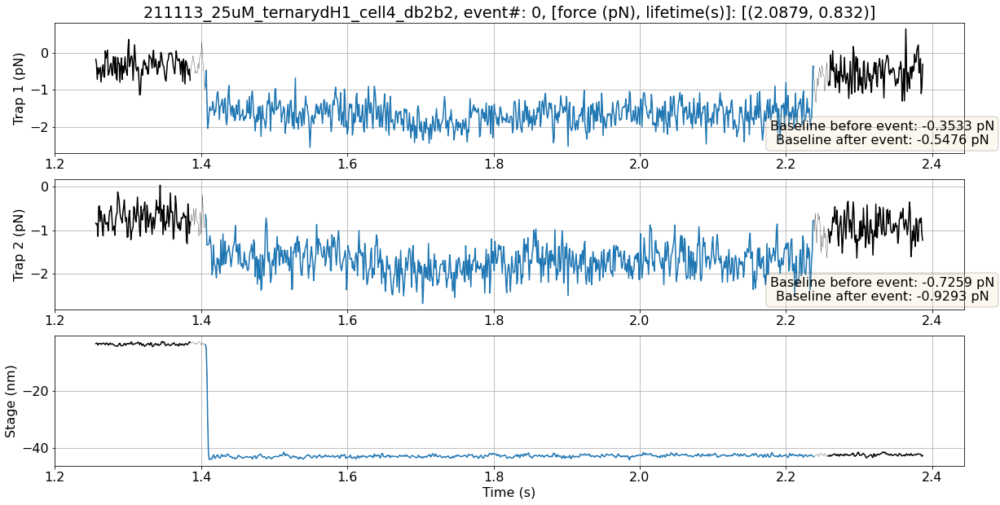

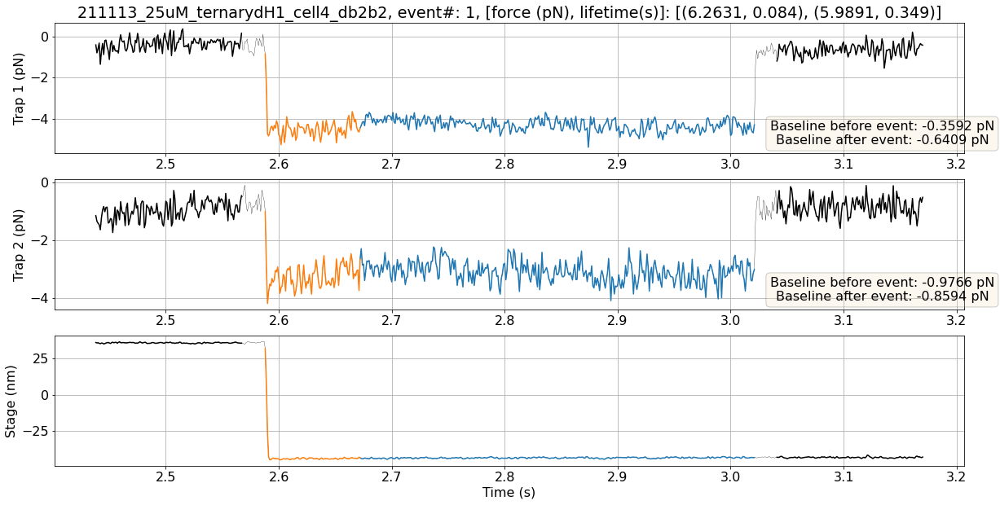

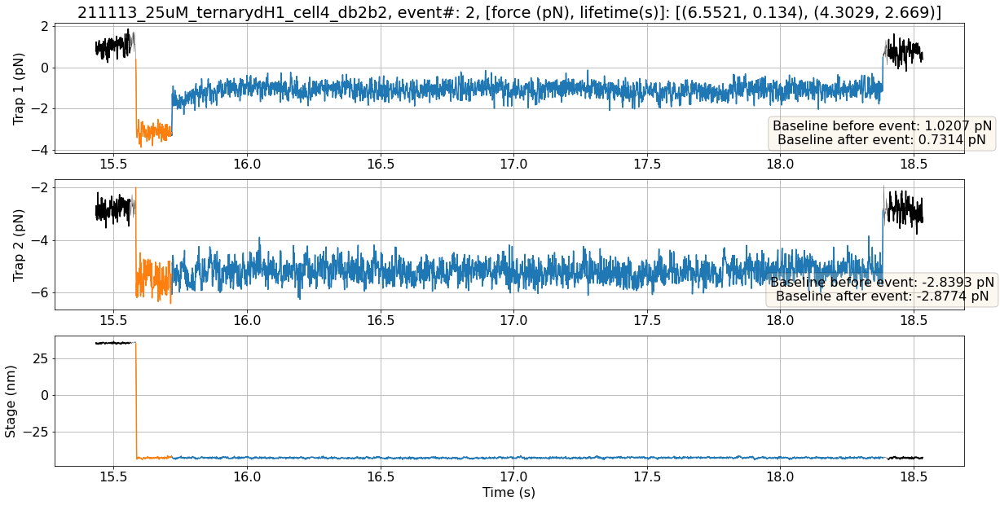

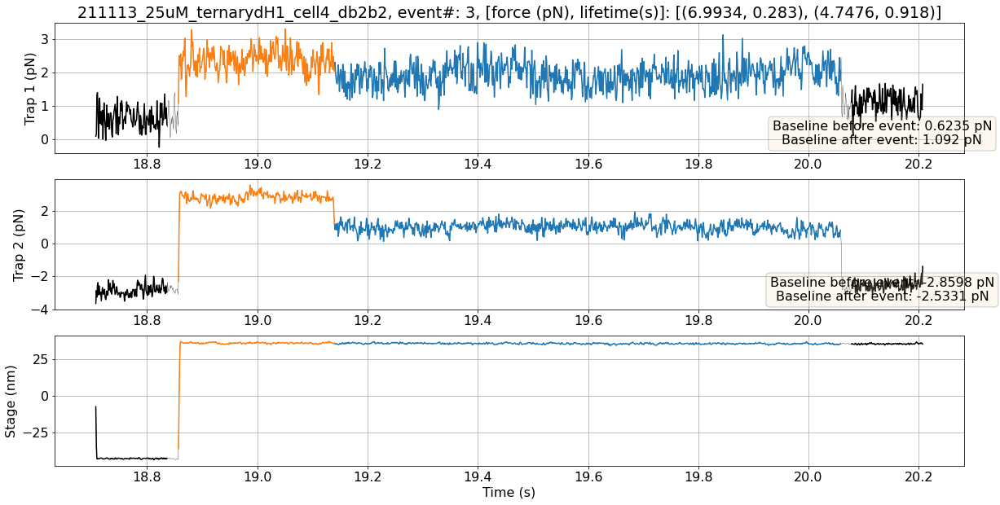

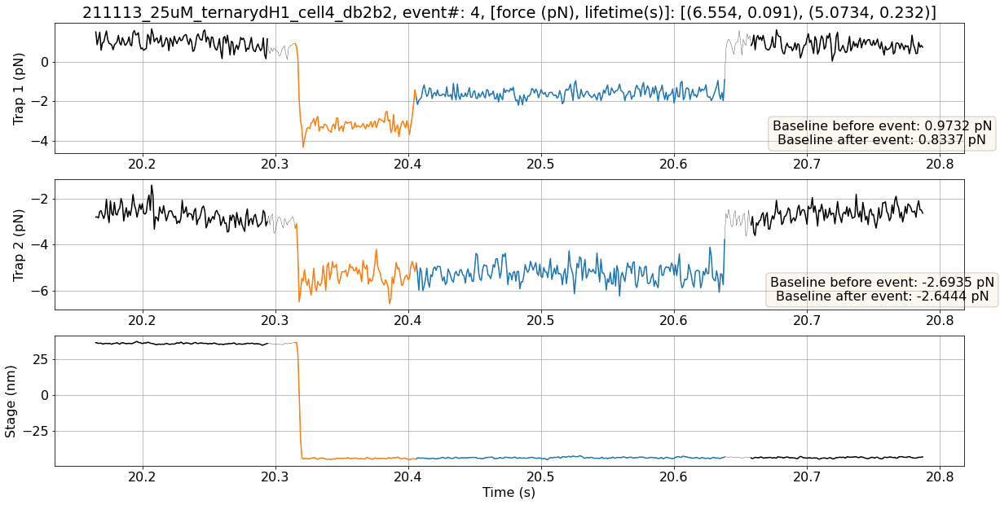

...

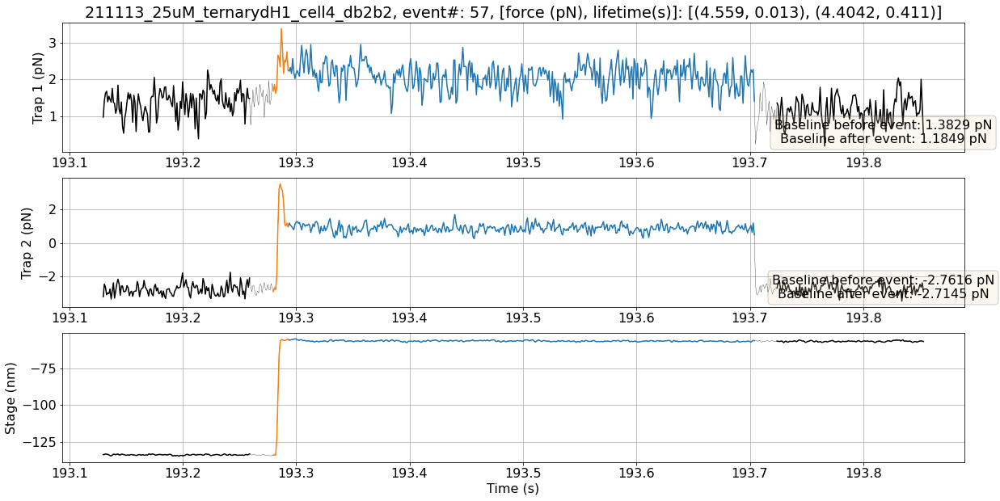

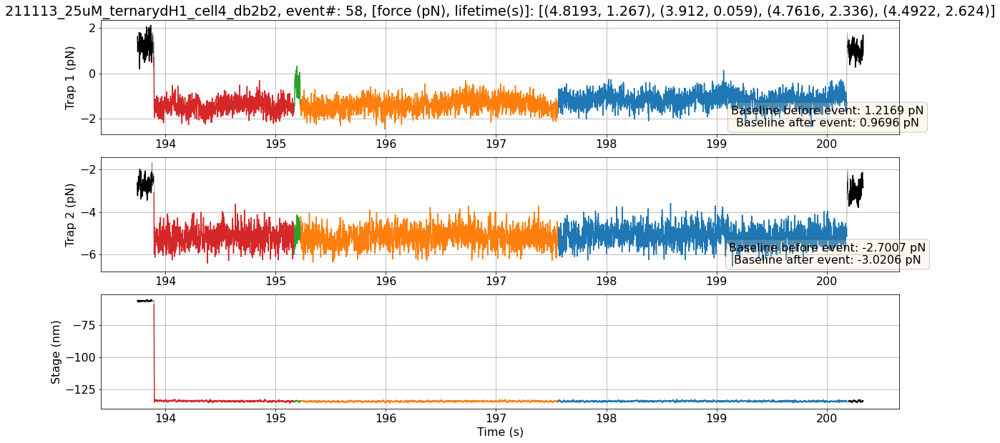

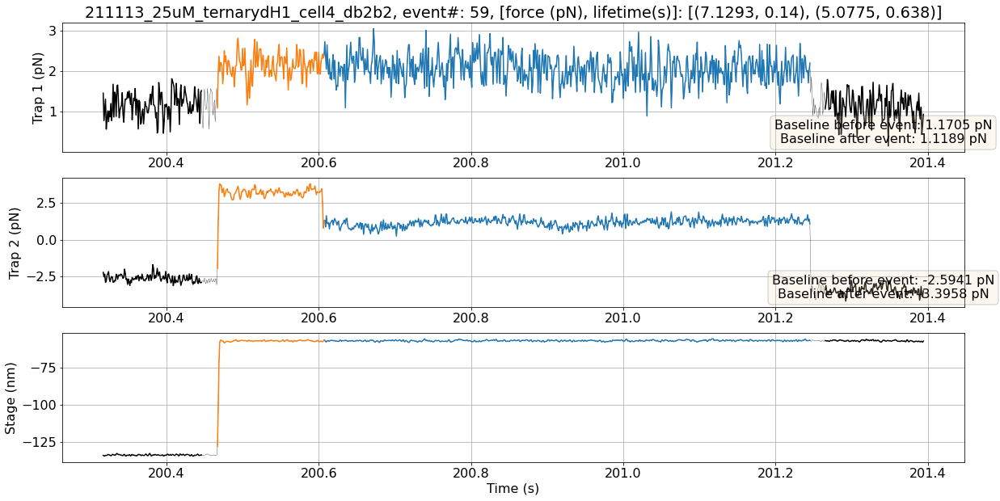

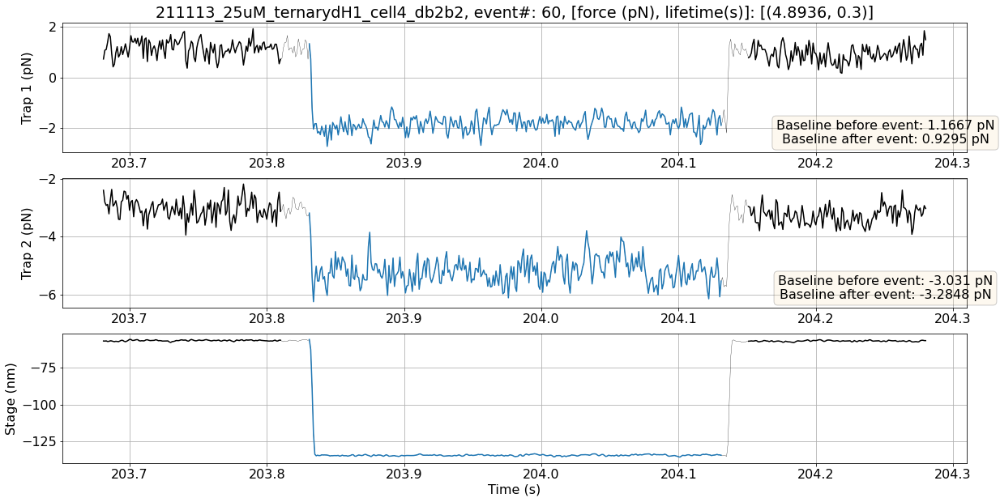

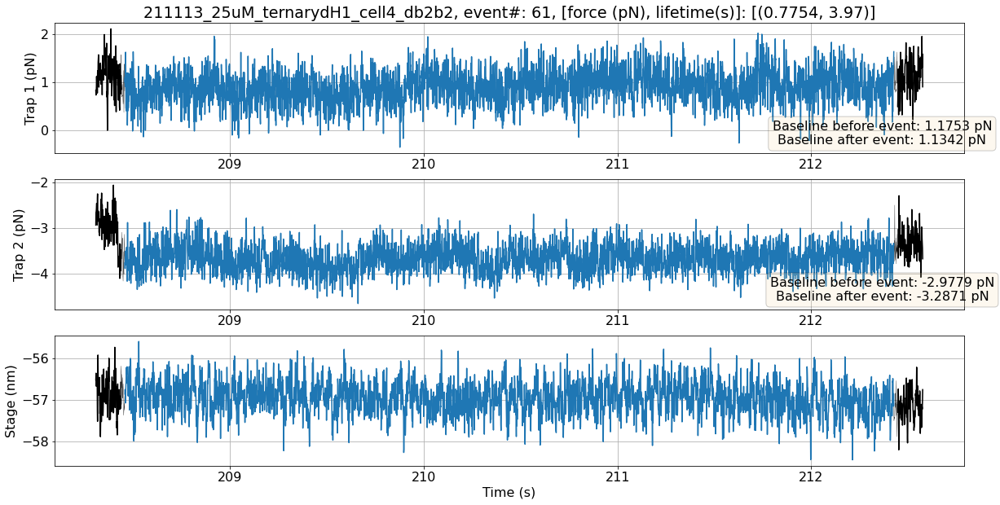

In [23]:
file_name = '/Users/amywang/Desktop/analysis/trap-analysis/ternarydH1_new_cal/211113_25uM_ternarydH1_cell4_db2b2.npz'
plot_traces_from_file(file_name)

In [36]:
# # SAVE CLASS OBJECT W ANALYZED DATA:

import pickle

def save_object(obj, filename):
    with open(filename, 'wb') as outp:  # Overwrites any existing file.
        pickle.dump(obj, outp, pickle.HIGHEST_PROTOCOL)
        
# save_object(analyze_events, 'analyzed_ternary_dH1_dataset.pkl')

In [37]:
terndH1_multistep_ls_F_lt = {'forces': ls_forces, 'lifetimes': ls_lifetimes}
save_object(terndH1_multistep_ls_F_lt, 'terndH1_multistep_last_step_Fvslifetime.pkl')  # save dict of last step forces and last step lifetimes

In [4]:
import xlrd

def extract_last_step_force_lifetimes_from_xls(filename, multi_or_single_step):
    file = xlrd.open_workbook(filename).sheet_by_index(0)

    multistep_events = []
    singlestep_events = []

    for row in range(6, file.nrows):
        number_of_entries = 0
        for col in range(file.ncols):
            if file.cell_type(row, col) is not xlrd.XL_CELL_EMPTY:
                number_of_entries += 1

        if number_of_entries > 2:
            multistep_events.append(file.row_values(row))
        if number_of_entries == 2:
            singlestep_events.append(file.row_values(row))
    
    # generate a list of (force, lifetime) tuples 
    
    if multi_or_single_step == 'multistep':
        last_step_f_lifetime = [(event_row[0], event_row[1]) for event_row in multistep_events]
    elif multi_or_single_step == 'singlestep':
        last_step_f_lifetime = [(event_row[0], event_row[1]) for event_row in singlestep_events]
    elif multistep_or_singlestep == 'all':
        last_step_f_lifetime = [(event_row[0], event_row[1]) for event_row in multistep_events + singlestep_events]
    else:
        raise ValueError("multistep_or_single_step should be either 'multistep', 'singlestep', or 'all'")
    
    last_step_forces, last_step_lifetimes = zip(*last_step_f_lifetime)
    return np.array(last_step_forces), np.array(last_step_lifetimes)

last_step_forces, last_step_lifetimes = extract_last_step_force_lifetimes_from_xls('/Users/amywang/Desktop/analysis/trap-analysis/xls/ternary_forcevslifetime.xls', 'multistep')

In [13]:
ternWT_multistep_ls_F_lt = {'forces': last_step_forces[last_step_forces > 0], 'lifetimes': last_step_lifetimes[last_step_forces > 0]}
df = pd.DataFrame.from_dict(ternWT_multistep_ls_F_lt)
df.to_excel('/Users/amywang/Desktop/analysis/trap-analysis/xls/positive_ternWT_multistep_last_step_Fvslifetime.xlsx')